In [1]:
# pip install xgboost

In [2]:
# pip install xgboost==0.90 --user

In [3]:
# pip install gensim

In [2]:
# Import libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import xgboost as xgb
import nltk 
import string
import re
import html
import os.path
import matplotlib.pyplot as plt
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import precision_recall_fscore_support
from collections import defaultdict
from sklearn.preprocessing import LabelEncoder
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from gensim.models import Word2Vec, FastText
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn import metrics
from tqdm.auto import tqdm

In [5]:
# nltk.download('punkt')
# nltk.download('stopwords')

### DATASET

In [11]:
### DATASET
# df = pd.read_excel('Dataset/ikn_twitter.xlsx')
df = pd.read_csv('Dataset/text_final_2.csv')

### CLEANING

In [7]:
### CLEANING

# REMOVE USER
def remove_pattern(input_txt, pattern):
    r = re.findall(pattern, input_txt)
    for i in r:
        input_txt = re.sub(i, '', input_txt)
    return input_txt    
df['remove_user'] = np.vectorize(remove_pattern)(df['Text'], "@[\w]*")

# SAVE HASIL REMOVE USER
df_remove_user = pd.DataFrame(data = df['remove_user'], columns = ['remove_user'])
df_remove_user.to_csv('Dataset/result/remove_user.csv')

def remove(tweet):
    # REMOVE ANGKA
    tweet = re.sub('[0-9]+', '', tweet)
    
    # REMOVE STOCK MARKET TICKERS LIKE $GE
    tweet = re.sub(r'\$\w*', '', tweet)
 
    # REMOVE OLD STYLE RETWEETS TEXT "RT"
    tweet = re.sub(r'^RT[\s]+', '', tweet)

    # REMOVE SPECIAL SYMBOLS “\x...”
    tweet = re.sub(r'\\x[0-9a-z]{1}', '', tweet)

    # REMOVE NEWLINE “\n”
    tweet = re.sub(r'\\n', '', tweet)

    # REMOVE “\x”
    tweet = re.sub(r'\\x', '', tweet)

    # REMOVE HYPERLINK
    tweet = re.sub(r'http.+', '', tweet)
    
    # REMOVE TANDA BACA
    tweet = re.sub(r"[#*,.!?'%/_:()<>$&\[\]\-\"]", ' ', tweet)

    return tweet
df['clean_text'] = df['remove_user'].apply(lambda x: remove(x))

# SAVE HASIL CLEANING
df_clean_text = pd.DataFrame(data = df['clean_text'], columns = ['clean_text'])
df_clean_text.to_csv('Dataset/result/clean_text.csv')

### CASEFOLDING

In [8]:
### CASEFOLDING
df['clean_text'] = df['clean_text'].str.lower()

# SAVE HASIL CASEFOLDING
df_casefolding = df[['clean_text']].copy()
df_casefolding.to_csv('Dataset/result/casefolding.csv')

### TOKENIZING

In [9]:
### TOKENIZING
df['tokenized'] = df.apply(lambda row: nltk.word_tokenize(row['clean_text']), axis=1)
def remove_punct(text):
    text  = " ".join([char for char in text if char not in string.punctuation])
    return text
df['tokenized'] = df['tokenized'].apply(lambda x: remove_punct(x))

text_token = [nltk.word_tokenize(text) for text in tqdm(df['tokenized'])]
tokenized = pd.DataFrame()
tokenized['text_token'] = text_token
tokenized['label'] = df['Label']
tokenized.to_csv('Dataset/result/tokenized_text.csv')

# SAVE HASIL TOKENIZING
df_tokenized = df[['tokenized']].copy()
df_tokenized.to_csv('Dataset/result/tokenized.csv')

In [12]:
text_token = [nltk.word_tokenize(text) for text in tqdm(df['text_final'])]
text_token[237]

['jujur',
 'habis',
 'vaksin',
 'terus',
 'hari',
 'kemudian',
 'cobain',
 'ini',
 'posisi',
 'badan',
 'pegal',
 'semua',
 'and',
 'gonnna',
 'lie',
 'feel',
 'more',
 'refreshed',
 'after',
 'tasting',
 'bikin',
 'melek',
 'sama',
 'seger',
 'badan',
 'lebih',
 'enak']

### STOPWORDING

In [10]:
### STOPWORD
list_stopwords = stopwords.words('indonesian')

def stopwords_removal(words):
    return [word for word in words if word not in list_stopwords]

df['stopword'] = df['tokenized'].apply(lambda x: ' '.join([word for word in x.split() if word not in (list_stopwords)]))
def remove_punct(text):
    text  = "".join([char for char in text if char not in string.punctuation])
    return text
df['stopword'] = df['stopword'].apply(lambda x: remove_punct(x))

stopword_tokenized = [nltk.word_tokenize(text) for text in tqdm(df['stopword'])]
tokenized_sw = pd.DataFrame()
tokenized_sw['stopword_tokenized'] = stopword_tokenized
tokenized_sw['label'] = df['Label']
tokenized_sw.to_csv('Dataset/result/tokenized_stopword.csv',index=False)

# SAVE HASIL STOPWORDING
df_stopword = df[['stopword']].copy()
df_stopword.to_csv('Dataset/result/stopword.csv')

In [11]:
list_stopwords = stopwords.words('indonesian')
print(len(list_stopwords))
print(list_stopwords)

758
['ada', 'adalah', 'adanya', 'adapun', 'agak', 'agaknya', 'agar', 'akan', 'akankah', 'akhir', 'akhiri', 'akhirnya', 'aku', 'akulah', 'amat', 'amatlah', 'anda', 'andalah', 'antar', 'antara', 'antaranya', 'apa', 'apaan', 'apabila', 'apakah', 'apalagi', 'apatah', 'artinya', 'asal', 'asalkan', 'atas', 'atau', 'ataukah', 'ataupun', 'awal', 'awalnya', 'bagai', 'bagaikan', 'bagaimana', 'bagaimanakah', 'bagaimanapun', 'bagi', 'bagian', 'bahkan', 'bahwa', 'bahwasanya', 'baik', 'bakal', 'bakalan', 'balik', 'banyak', 'bapak', 'baru', 'bawah', 'beberapa', 'begini', 'beginian', 'beginikah', 'beginilah', 'begitu', 'begitukah', 'begitulah', 'begitupun', 'bekerja', 'belakang', 'belakangan', 'belum', 'belumlah', 'benar', 'benarkah', 'benarlah', 'berada', 'berakhir', 'berakhirlah', 'berakhirnya', 'berapa', 'berapakah', 'berapalah', 'berapapun', 'berarti', 'berawal', 'berbagai', 'berdatangan', 'beri', 'berikan', 'berikut', 'berikutnya', 'berjumlah', 'berkali-kali', 'berkata', 'berkehendak', 'berkeingi

### EKSTRAKSI FITUR TF-IDF & KLASIFIKASI XGBOOST

In [17]:
### EKSTRAKSI FITUR TF-IDF
# READ DATA HASIL STOPWORD
# stopword_text = pd.read_csv('Dataset/result/stopword.csv')
# corpus = stopword_text['stopword']
stopword_text = pd.read_excel('Dataset/text_final.xlsx')
corpus = stopword_text['text_final']

# EKSTRAKSI FITUR
vectorizer = TfidfVectorizer()
tfidf_matrix = vectorizer.fit_transform(corpus)

# SAVE HASIL EKSTRAKSI FITUR
df_tfidf = pd.DataFrame(tfidf_matrix.toarray(), columns = vectorizer.get_feature_names())
df_tfidf.to_csv('Dataset/result/tfidf_2.csv',index=False)

### KLASIFIKASI XGB
# READ DATA
data = df_tfidf
X = data
le = LabelEncoder()
y = le.fit_transform(df.Label)

# SPLIT DATA TRAIN DAN TEST
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

AttributeError: 'DataFrame' object has no attribute 'Label'

In [10]:
df_tfidf.shape

(900, 3377)

0.5911111111111111

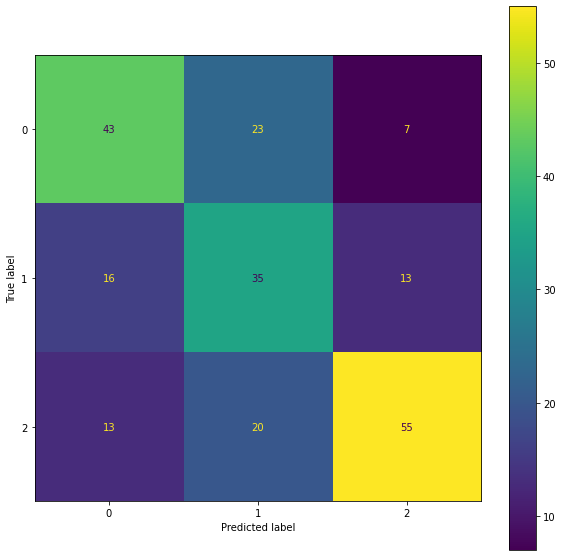

In [11]:
# TRAINING MODEL 
# PARAMETER DEFAULT

xgb_model = xgb.XGBClassifier(random_state=42)
xgb_model.fit(X_train, y_train)

# KLASIFIKASI DATA TEST
y_pred = xgb_model.predict(X_test)

# CONFUSION MAATRIX
accuracy = metrics.accuracy_score(y_test, y_pred)

# TAMPILKAN CONFUSION MATRIX
fig, ax = plt.subplots(figsize=(10,10))
disp = metrics.ConfusionMatrixDisplay(metrics.confusion_matrix(y_test, y_pred),display_labels=xgb_model.classes_)
disp.plot(ax=ax, values_format='')

# SIMPAN CONFUSION MATRIX
plt.savefig('Dataset/result/tfidf_confu.png')

# print((classification_report(y_test, y_pred)))
accuracy

Pohon ke-1


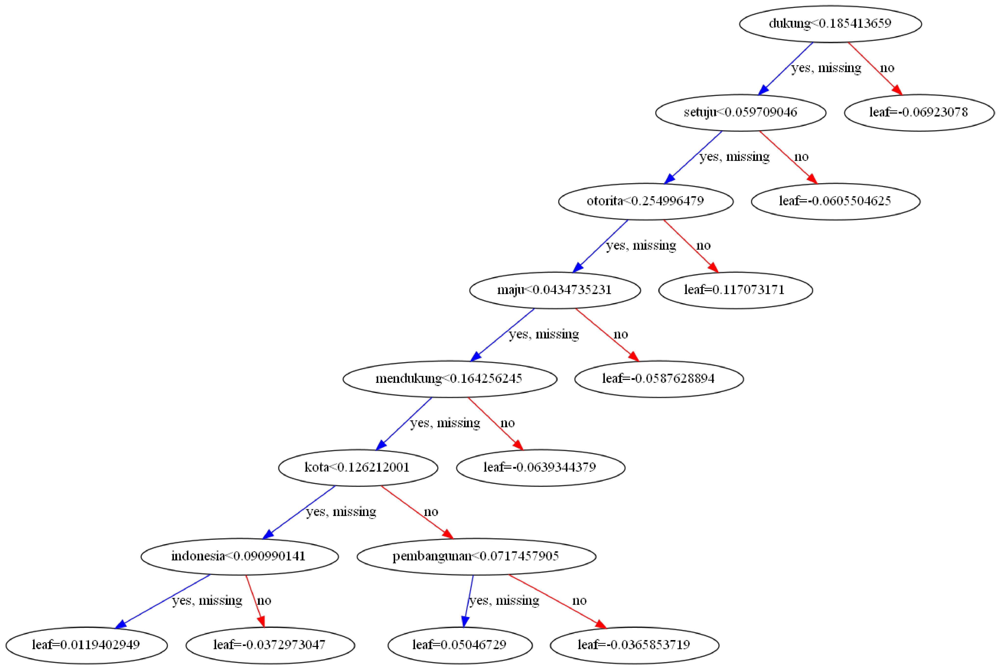

Pohon ke-2


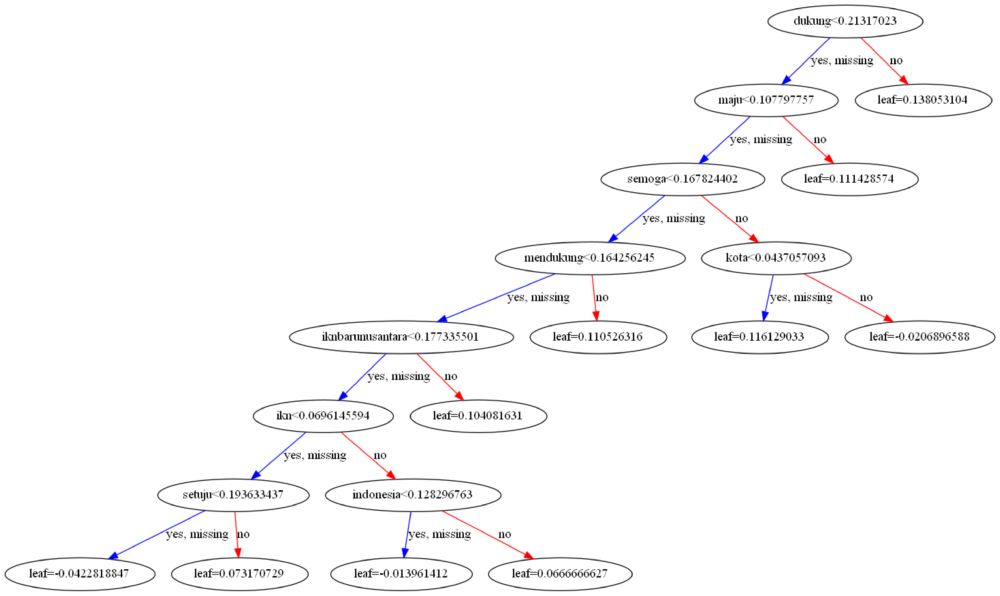

Pohon ke-100


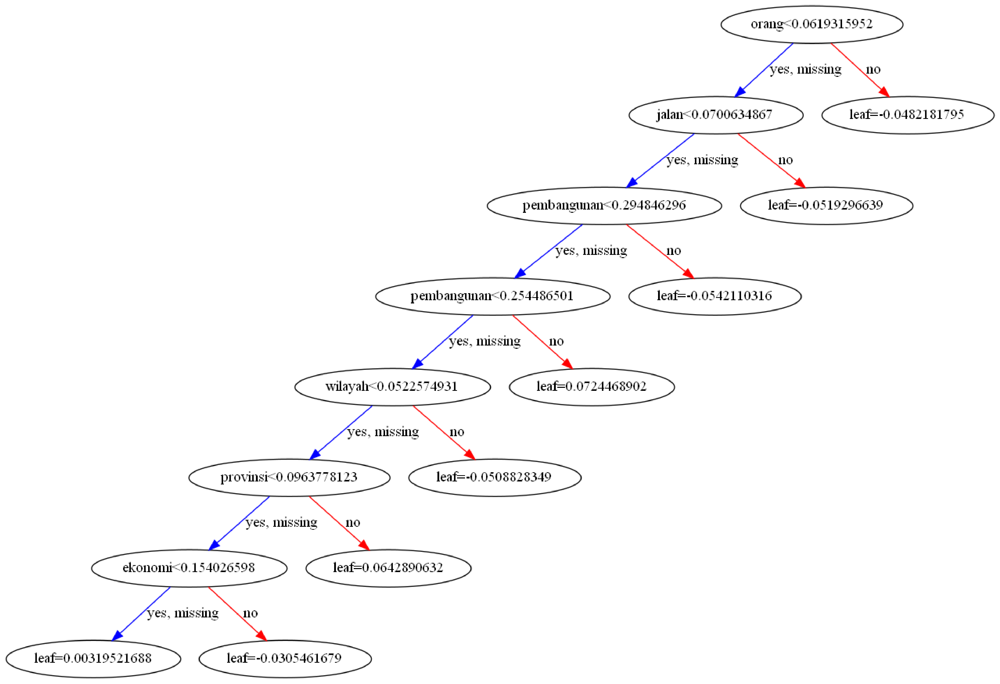

In [58]:
# MENAMPILKAN POHON XGB TF-IDF
# PARAMETER DEFAULT

from xgboost import plot_tree
from matplotlib.pylab import rcParams

rcParams['figure.figsize'] = 80,50

tree = [1,2,100]
for i in tree :
    print("Pohon ke-"+str(i))
    plot_tree(xgb_model, num_trees=i)
    plt.show()

In [18]:
# max_depth
max_depth = {
    'parameter' : range(1,11,1),
    'accuracy' : []
}
index_j = 0
for j in max_depth['parameter'] :
    xgb_model = xgb.XGBClassifier(max_depth=j,gamma=0,learning_rate= 0.1,n_estimators=100,random_state=42)
    xgb_model.fit(X_train, y_train)

    # KLASIFIKASI DATA TEST
    y_pred = xgb_model.predict(X_test)
    # CONFUSION MAATRIX
    max_depth['accuracy'].append(metrics.accuracy_score(y_test, y_pred))
    index_j+=1
max_depth_df = pd.DataFrame(max_depth)
max_depth_df.to_csv('Dataset/result/max_depth_tuning.csv')

In [19]:
#gamma
gamma = {
    'parameter' : np.arange(0, 1.1, 0.1),
    'accuracy' : []
}    
index_j = 0
for j in gamma['parameter'] :
    xgb_model = xgb.XGBClassifier(max_depth=7,gamma=j,learning_rate= 0.1,n_estimators=100,random_state=42)
    xgb_model.fit(X_train, y_train)

    # KLASIFIKASI DATA TEST
    y_pred = xgb_model.predict(X_test)
    # CONFUSION MAATRIX
    gamma['accuracy'].append(metrics.accuracy_score(y_test, y_pred))
    index_j+=1
gamma_df = pd.DataFrame(gamma)
gamma_df.to_csv('Dataset/result/gamma_tuning.csv')

In [24]:
#learning_rate
learning_rate = {
    'parameter' : np.arange(0, 1.1, 0.1),
    'accuracy' : []
}
index_j = 0
for j in learning_rate['parameter'] :
    xgb_model = xgb.XGBClassifier(max_depth=7,gamma=0.7,learning_rate=j,n_estimators=100,random_state=42)
    xgb_model.fit(X_train, y_train)

    # KLASIFIKASI DATA TEST
    y_pred = xgb_model.predict(X_test)
    # CONFUSION MAATRIX
    learning_rate['accuracy'].append(metrics.accuracy_score(y_test, y_pred))
    index_j+=1
learning_rate_df = pd.DataFrame(learning_rate)
learning_rate_df.to_csv('Dataset/result/learning_rate_tuning.csv')


In [27]:
#n_estimators
n_estimators = {
    'parameter' : range(50,550,50),
    'accuracy' : []
}  
index_j = 0
for j in n_estimators['parameter'] :
    xgb_model = xgb.XGBClassifier(max_depth=7,gamma=0.7,learning_rate=0.1,n_estimators=j,random_state=42)
    xgb_model.fit(X_train, y_train)

    # KLASIFIKASI DATA TEST
    y_pred = xgb_model.predict(X_test)
    # CONFUSION MAATRIX
    n_estimators['accuracy'].append(metrics.accuracy_score(y_test, y_pred))
    index_j+=1
n_estimators_df = pd.DataFrame(n_estimators)
n_estimators_df.to_csv('Dataset/result/n_estimators_tuning.csv')

### EKSTRAKSI FITUR WORD2VEC & KLASIFIKASI XGBOOST

In [28]:
### EKSTRAKSI FITUR WORD2VEC
# READ DATA
df_wiki_corpus = pd.read_csv('Dataset/corpus_wiki.csv')

# CORPUS WIKI SENTENCES
sentences = [nltk.word_tokenize(text) for text in tqdm(df_wiki_corpus['text'])]

### PEMODELAN W2V DENGAN DATA TANPA STOPWORDING

In [29]:
### PEMODELAN W2V DENGAN DATA TANPA STOPWORDING
# READ DATA 
X_ts = df_tokenized['tokenized']
le = LabelEncoder()
y = le.fit_transform(df.Label)

## note :
## ts = tanpa stopwording

# SPLIT DATA TRAIN DAN TEST
X_train_ts, X_test_ts, y_train_ts, y_test_ts = train_test_split(X_ts, y, test_size=0.25, random_state=42)

# NEW SENTENCES
ts_train_sentences = [nltk.word_tokenize(X_train_ts) for X_train_ts in tqdm(X_train_ts)]
ts_sentences = sentences + ts_train_sentences

if not os.path.exists('Dataset/model/w2v_tanpa_stopwording.model') :
    # TRAINING MODEL W2V
    model_ts = Word2Vec(ts_sentences, window=5, min_count=1, workers=4)

    # SAVE MODEL W2V
    model_ts.save('Dataset/model/w2v_tanpa_stopwording.model')
else :
    model_ts = Word2Vec.load('Dataset/model/w2v_tanpa_stopwording.model')

### PEMODELAN W2V DENGAN DATA STOPWORDING

In [30]:
### PEMODELAN W2V DENGAN DATA STOPWORDING
# READ DATA 
X_ds = df_stopword['stopword']
le = LabelEncoder()
y = le.fit_transform(df.Label)

## note :
## ds = dengan stopwording

# SPLIT DATA TRAIN DAN TEST
X_train_ds, X_test_ds, y_train_ds, y_test_ds = train_test_split(X_ds, y, test_size=0.25, random_state=42)

# NEW SENTENCES
ds_train_sentences = [nltk.word_tokenize(X_train_ds) for X_train_ds in tqdm(X_train_ds)]
ds_sentences = sentences + ds_train_sentences

if not os.path.exists('Dataset/model/w2v_dengan_stopwording.model') :
    # TRAINING MODEL W2V
    model_ds = Word2Vec(ds_sentences, window=5, min_count=1, workers=4)

    # SAVE MODEL W2V
    model_ds.save('Dataset/model/w2v_dengan_stopwording.model')
else :
    model_ds = Word2Vec.load('Dataset/model/w2v_dengan_stopwording.model')

### EKSTRAKSI FITUR W2V

In [31]:
# FUNCTION EKSTRAKSI FITUR W2V
def ekstraksi_fitur(sentences, model) :
    list_vector = []
    for i in range(len(sentences)) :
        vector = []
        for j in range(len(sentences[i])) :
            try:
                word_vector = model.wv[sentences[i][j]]
            except KeyError:
                np.zeros(100)
            if not vector :
                vector = word_vector.tolist()
            else :
                for k in range(len(word_vector)) :
                    vector[k] += word_vector.tolist()[k]
        for l in range(100) :
            vector[l] = vector[l]/len(sentences[i])
        list_vector.append(vector)
    return list_vector

In [32]:
# EKSTRAKSI FITUR W2V PADA DATA TANPA STOPWORDING
# EKSTRAKSI DATA TRAIN
eks_fitur_train_ts = ekstraksi_fitur(ts_train_sentences, model_ts)
# eks_fitur_train_ts = ekstraksi_fitur(ts_sentences, model_ts)

# EKSTRAKSI DATA TEST
ts_test_sentences = [nltk.word_tokenize(X_test_ts) for X_test_ts in tqdm(X_test_ts)]
eks_fitur_test_ts = ekstraksi_fitur(ts_test_sentences, model_ts)

In [33]:
df_eks_train_ts = pd.DataFrame(eks_fitur_train_ts)
df_eks_train_ts.insert(0, 'document', ts_train_sentences)
df_eks_train_ts.insert(1, 'Class_label', y_train_ts)
df_eks_train_ts.to_csv('Dataset/result/ekstraksi_data_train_tanpa_stopword.csv')

df_eks_test_ts = pd.DataFrame(eks_fitur_test_ts)
df_eks_test_ts.insert(0, 'document', ts_test_sentences)
df_eks_test_ts.insert(1, 'Class_label', y_test_ts)
df_eks_test_ts.to_csv('Dataset/result/ekstraksi_data_test_tanpa_stopword.csv')

In [34]:
model_ts.wv[ts_train_sentences[0]]

array([[ 9.38636363e-01, -1.41773963e+00,  8.63173842e-01,
         5.82298815e-01,  1.23869431e+00,  1.21553636e+00,
        -2.59263396e-01,  1.24984300e+00,  1.74405992e+00,
        -2.39202246e-01, -1.52469146e+00,  8.81159157e-02,
         7.03577220e-01, -1.78936517e+00, -1.15956932e-01,
         4.77994591e-01,  3.66800046e+00,  1.96660841e+00,
         7.35138714e-01, -1.23956048e+00, -2.06284121e-01,
         2.74066710e+00,  1.86638868e+00, -1.19791281e+00,
         3.48324919e+00,  1.43123019e+00, -1.17808735e+00,
         2.51702312e-02,  1.63741553e+00,  2.70187044e+00,
        -1.45865440e-01,  7.42285311e-01, -1.27223694e+00,
         7.23103702e-01,  1.91651434e-01,  2.11160564e+00,
        -4.75193214e+00, -6.31001294e-01,  7.39322901e-01,
        -1.77148426e+00, -4.41349506e+00,  1.28985405e+00,
         2.96492958e+00,  2.51045561e+00,  1.03078055e+00,
         1.86879230e+00, -4.16508675e+00,  2.42473698e+00,
        -4.07438755e+00,  3.13124925e-01, -9.60455716e-0

In [35]:
df_vectorkata = pd.DataFrame(model_ts.wv[ts_train_sentences[102]])
df_vectorkata.insert(0, 'document', ts_train_sentences[102])
df_vectorkata.to_csv('Dataset/result/vektor_kata_data_train_ts_positif.csv')

df_vectorkata = pd.DataFrame(model_ts.wv[ts_test_sentences[147]])
df_vectorkata.insert(0, 'document', ts_test_sentences[147])
df_vectorkata.to_csv('Dataset/result/vektor_kata_data_test_ts_negatif_.csv')

              precision    recall  f1-score   support

           0       0.63      0.53      0.58        73
           1       0.43      0.70      0.54        64
           2       0.88      0.59      0.71        88

    accuracy                           0.60       225
   macro avg       0.65      0.61      0.61       225
weighted avg       0.67      0.60      0.62       225

0.6666666666666666


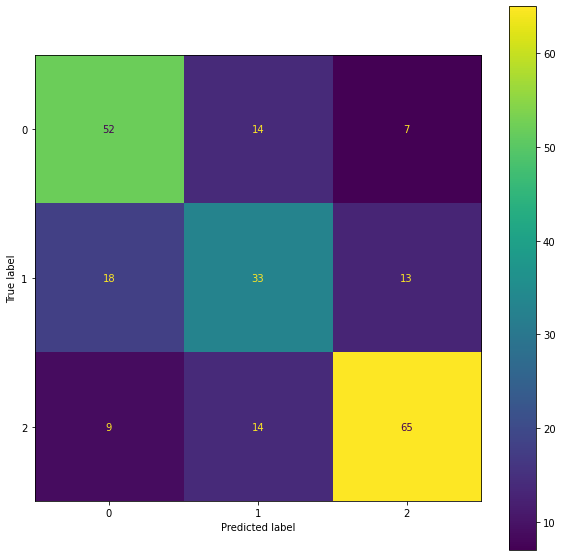

In [36]:
# TRAINING MODEL
# PARAMETER DEFAULT
xgb_model_ts = xgb.XGBClassifier(random_state=42)
xgb_model_ts.fit(eks_fitur_train_ts, y_train_ts)

# KLASIFIKASI DATA TEST
y_pred_ts = xgb_model_ts.predict(eks_fitur_test_ts)

# CONFUSION MAATRIX
accuracy = metrics.accuracy_score(y_test_ts, y_pred_ts)

print((classification_report(y_test, y_pred)))
print(accuracy)

# TAMPILKAN CONFUSION MATRIX
fig, ax = plt.subplots(figsize=(10,10))
disp = metrics.ConfusionMatrixDisplay(metrics.confusion_matrix(y_test_ts, y_pred_ts),display_labels=xgb_model_ts.classes_)
disp.plot(ax=ax, values_format='')

# SIMPAN CONFUSION MATRIX
plt.savefig('Dataset/result/w2v_ts_confu.png')

Pohon ke-1


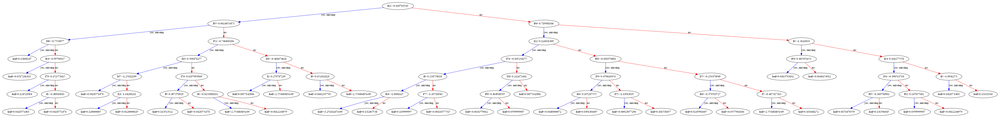

Pohon ke-2


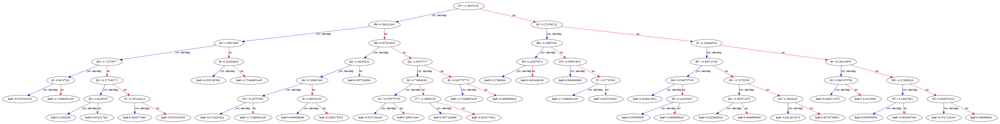

Pohon ke-100


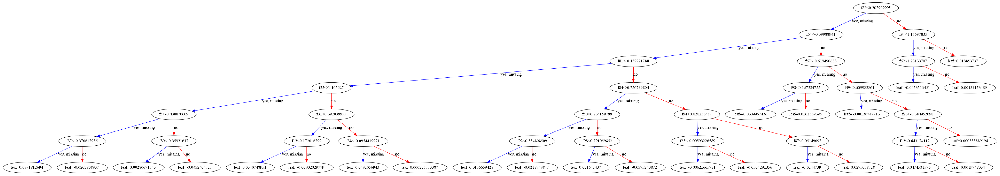

In [57]:
# MENAMPILKAN POHON XGB W2V TANPA STOPWORDING
# PARAMETER DEFAULT

from xgboost import plot_tree
from matplotlib.pylab import rcParams

rcParams['figure.figsize'] = 80,50

tree = [1,2,100]
for i in tree :
    print("Pohon ke-"+str(i))
    plot_tree(xgb_model_ts, num_trees=i)
    plt.show()

In [37]:
# max_depth
max_depth = {
    'parameter' : range(1,11,1),
    'accuracy' : []
}
index_j = 0
for j in max_depth['parameter'] :
    xgb_model_ts = xgb.XGBClassifier(max_depth=j,gamma=0,learning_rate= 0.1,n_estimators=100,random_state=42)
    xgb_model_ts.fit(eks_fitur_train_ts, y_train_ts)

    # KLASIFIKASI DATA TEST
    y_pred_ts = xgb_model_ts.predict(eks_fitur_test_ts)
    # CONFUSION MAATRIX
    max_depth['accuracy'].append(metrics.accuracy_score(y_test_ts, y_pred_ts))
    index_j+=1
max_depth_df = pd.DataFrame(max_depth)
max_depth_df.to_csv('Dataset/result/max_depth_tuning_ts.csv')

In [38]:
#gamma
gamma = {
    'parameter' : np.arange(0, 1.1, 0.1),
    'accuracy' : []
}    
index_j = 0
for j in gamma['parameter'] :
    xgb_model_ts = xgb.XGBClassifier(max_depth=6,gamma=j,learning_rate= 0.1,n_estimators=100,random_state=42)
    xgb_model_ts.fit(eks_fitur_train_ts, y_train_ts)

    # KLASIFIKASI DATA TEST
    y_pred_ts = xgb_model_ts.predict(eks_fitur_test_ts)
    # CONFUSION MAATRIX
    gamma['accuracy'].append(metrics.accuracy_score(y_test_ts, y_pred_ts))
    index_j+=1
gamma_df = pd.DataFrame(gamma)
gamma_df.to_csv('Dataset/result/gamma_tuning_ts.csv')

In [39]:
#learning_rate
learning_rate = {
    'parameter' : np.arange(0, 1.1, 0.1),
    'accuracy' : []
}
index_j = 0
for j in learning_rate['parameter'] :
    xgb_model_ts = xgb.XGBClassifier(max_depth=6,gamma=0,learning_rate=j,n_estimators=100,random_state=42)
    xgb_model_ts.fit(eks_fitur_train_ts, y_train_ts)

    # KLASIFIKASI DATA TEST
    y_pred_ts = xgb_model_ts.predict(eks_fitur_test_ts)
    # CONFUSION MAATRIX
    learning_rate['accuracy'].append(metrics.accuracy_score(y_test_ts, y_pred_ts))
    index_j+=1
learning_rate_df = pd.DataFrame(learning_rate)
learning_rate_df.to_csv('Dataset/result/learning_rate_tuning_ts.csv')

In [40]:
#n_estimators
n_estimators = {
    'parameter' : range(50,550,50),
    'accuracy' : []
}  
index_j = 0
for j in n_estimators['parameter'] :
    xgb_model_ts = xgb.XGBClassifier(max_depth=6,gamma=0,learning_rate=0.1,n_estimators=j,random_state=42)
    xgb_model_ts.fit(eks_fitur_train_ts, y_train_ts)

    # KLASIFIKASI DATA TEST
    y_pred_ts = xgb_model_ts.predict(eks_fitur_test_ts)
    # CONFUSION MAATRIX
    n_estimators['accuracy'].append(metrics.accuracy_score(y_test_ts, y_pred_ts))
    index_j+=1
n_estimators_df = pd.DataFrame(n_estimators)
n_estimators_df.to_csv('Dataset/result/n_estimators_tuning_ts.csv')

In [41]:
# EKSTRAKSI FITUR W2V PADA DATA DENGAN STOPWORDING
# EKSTRAKSI DATA TRAIN
eks_fitur_train_ds = ekstraksi_fitur(ds_train_sentences, model_ds)
# eks_fitur_train_ds = ekstraksi_fitur(ds_sentences, model_ds)

# EKSTRAKSI DATA TEST
ds_test_sentences = [nltk.word_tokenize(X_test_ds) for X_test_ds in tqdm(X_test_ds)]
eks_fitur_test_ds = ekstraksi_fitur(ds_test_sentences, model_ds)

In [42]:
df_eks_train_ds = pd.DataFrame(eks_fitur_train_ds)
df_eks_train_ds.insert(0, 'document', ds_train_sentences)
df_eks_train_ds.insert(1, 'Class_label', y_train_ds)
df_eks_train_ds
df_eks_train_ds.to_csv('Dataset/result/ekstraksi_data_train_dengan_stopword.csv')

df_eks_test_ds = pd.DataFrame(eks_fitur_test_ds)
df_eks_test_ds.insert(0, 'document', ds_test_sentences)
df_eks_test_ds.insert(1, 'Class_label', y_test_ds)
df_eks_test_ds.to_csv('Dataset/result/ekstraksi_data_test_dengan_stopword.csv')

In [43]:
model_ds.wv[ts_train_sentences[0]]

array([[ 1.00479174e+00,  1.27487704e-01,  7.87795603e-01,
         2.16193318e+00, -5.12066483e-01,  2.94220734e+00,
         8.89801800e-01,  1.23306608e+00,  1.71659958e+00,
         1.78367686e+00, -1.71959865e+00,  1.75000831e-01,
         1.06833959e+00, -2.19055033e+00,  6.17582440e-01,
         9.99261320e-01,  2.15985155e+00,  9.74168062e-01,
         1.10864353e+00, -1.56720483e+00, -9.28564370e-01,
         2.00286436e+00, -3.69779132e-02, -5.81656396e-01,
         3.78180099e+00,  2.14637756e+00, -6.94311440e-01,
        -5.19599199e-01,  9.90454435e-01,  2.21400452e+00,
         1.06601536e+00, -1.08400464e+00, -1.25582421e+00,
        -2.08241606e+00,  1.03828800e+00,  1.12981729e-01,
        -6.02761459e+00, -1.96711850e+00,  7.03346968e-01,
        -8.87547433e-01, -3.97020030e+00,  1.05357468e+00,
         1.72135305e+00,  1.67602086e+00,  1.87737966e+00,
         2.89064336e+00, -6.60774782e-02, -1.81143045e+00,
        -4.82073641e+00,  1.13191020e+00, -1.08216584e+0

In [44]:
df_vectorkata = pd.DataFrame(model_ds.wv[ds_train_sentences[102]])
df_vectorkata.insert(0, 'document', ds_train_sentences[102])
df_vectorkata.to_csv('Dataset/result/vektor_kata_data_train_ds_positif.csv')

df_vectorkata = pd.DataFrame(model_ds.wv[ds_test_sentences[147]])
df_vectorkata.insert(0, 'document', ds_test_sentences[147])
df_vectorkata.to_csv('Dataset/result/vektor_kata_data_test_ds_negatif.csv')

              precision    recall  f1-score   support

           0       0.63      0.53      0.58        73
           1       0.43      0.70      0.54        64
           2       0.88      0.59      0.71        88

    accuracy                           0.60       225
   macro avg       0.65      0.61      0.61       225
weighted avg       0.67      0.60      0.62       225

0.6266666666666667


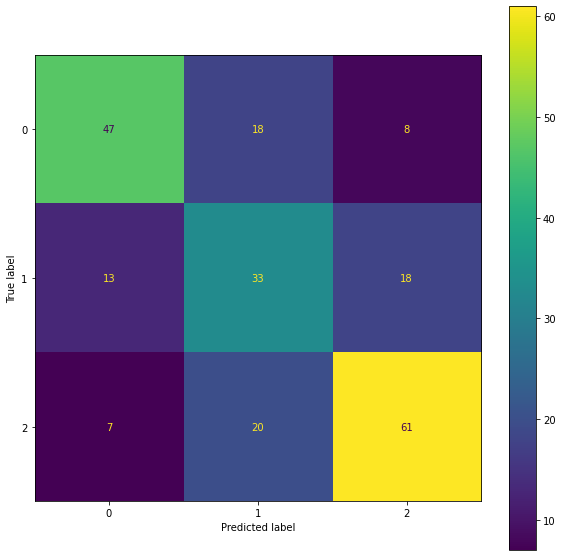

In [45]:
# TRAINING MODEL
# PARAMETER DEFAULT

xgb_model_ds = xgb.XGBClassifier(random_state=42)
xgb_model_ds.fit(eks_fitur_train_ds, y_train_ds)

# KLASIFIKASI DATA TEST
y_pred_ds = xgb_model_ds.predict(eks_fitur_test_ds)

# CONFUSION MAATRIX
accuracy = metrics.accuracy_score(y_test_ds, y_pred_ds)

print((classification_report(y_test, y_pred)))
print(accuracy)

# TAMPILKAN CONFUSION MATRIX
fig, ax = plt.subplots(figsize=(10,10))
disp = metrics.ConfusionMatrixDisplay(metrics.confusion_matrix(y_test_ds, y_pred_ds),display_labels=xgb_model_ds.classes_)
disp.plot(ax=ax, values_format='')

# SIMPAN CONFUSION MATRIX
plt.savefig('Dataset/result/w2v_ds_confu.png')

Pohon ke-1


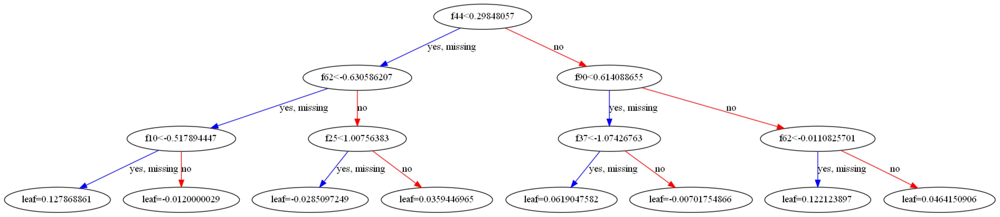

Pohon ke-2


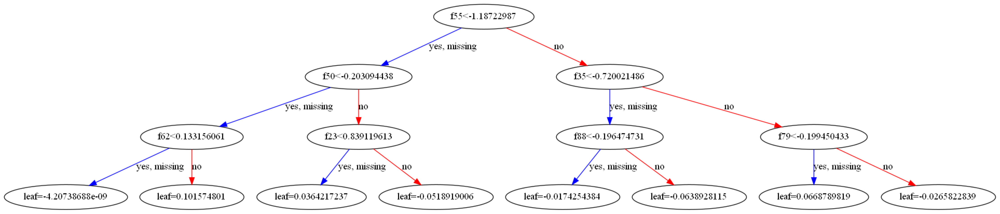

Pohon ke-100


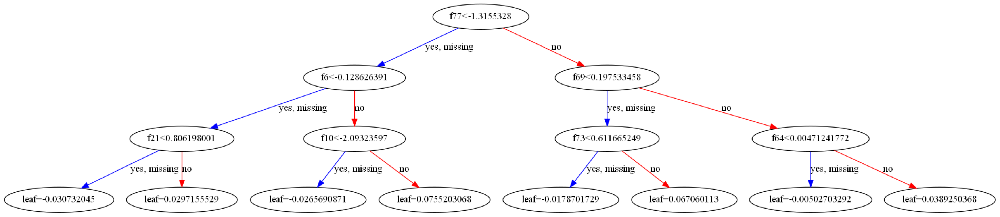

In [56]:
# MENAMPILKAN POHON XGB W2V DENGAN STOPWORDING
# PARAMETER DEFAULT

from xgboost import plot_tree
from matplotlib.pylab import rcParams

rcParams['figure.figsize'] = 80,50

tree = [1,2,100]
for i in tree :
    print("Pohon ke-"+str(i))
    plot_tree(xgb_model_ds, num_trees=i)
    plt.show()

In [46]:
# max_depth
max_depth = {
    'parameter' : range(1,11,1),
    'accuracy' : []
}
index_j = 0
for j in max_depth['parameter'] :
    xgb_model_ds = xgb.XGBClassifier(max_depth=j,gamma=0,learning_rate= 0.1,n_estimators=100,random_state=42)
    xgb_model_ds.fit(eks_fitur_train_ds, y_train_ds)

    # KLASIFIKASI DATA TEST
    y_pred_ds = xgb_model_ds.predict(eks_fitur_test_ds)
    # CONFUSION MAATRIX
    max_depth['accuracy'].append(metrics.accuracy_score(y_test_ds, y_pred_ds))
    index_j+=1
max_depth_df = pd.DataFrame(max_depth)
max_depth_df.to_csv('Dataset/result/max_depth_tuning_ds.csv')

In [47]:
#gamma
gamma = {
    'parameter' : np.arange(0, 1.1, 0.1),
    'accuracy' : []
}    
index_j = 0
for j in gamma['parameter'] :
    xgb_model_ds = xgb.XGBClassifier(max_depth=3,gamma=j,learning_rate= 0.1,n_estimators=100,random_state=42)
    xgb_model_ds.fit(eks_fitur_train_ds, y_train_ds)

    # KLASIFIKASI DATA TEST
    y_pred_ds = xgb_model_ds.predict(eks_fitur_test_ds)
    # CONFUSION MAATRIX
    gamma['accuracy'].append(metrics.accuracy_score(y_test_ds, y_pred_ds))
    index_j+=1
gamma_df = pd.DataFrame(gamma)
gamma_df.to_csv('Dataset/result/gamma_tuning_ds.csv')

In [48]:
#learning_rate
learning_rate = {
    'parameter' : np.arange(0, 1.1, 0.1),
    'accuracy' : []
}
index_j = 0
for j in learning_rate['parameter'] :
    xgb_model_ds = xgb.XGBClassifier(max_depth=3,gamma=0.5,learning_rate=j,n_estimators=100,random_state=42)
    xgb_model_ds.fit(eks_fitur_train_ds, y_train_ds)

    # KLASIFIKASI DATA TEST
    y_pred_ds = xgb_model_ds.predict(eks_fitur_test_ds)
    # CONFUSION MAATRIX
    learning_rate['accuracy'].append(metrics.accuracy_score(y_test_ds, y_pred_ds))
    index_j+=1
learning_rate_df = pd.DataFrame(learning_rate)
learning_rate_df.to_csv('Dataset/result/learning_rate_tuning_ds.csv')

In [49]:
#n_estimators
n_estimators = {
    'parameter' : range(50,550,50),
    'accuracy' : []
}  
index_j = 0
for j in n_estimators['parameter'] :
    xgb_model_ds = xgb.XGBClassifier(max_depth=3,gamma=0.5,learning_rate=0.1,n_estimators=j,random_state=42)
    xgb_model_ds.fit(eks_fitur_train_ds, y_train_ds)

    # KLASIFIKASI DATA TEST
    y_pred_ds = xgb_model_ds.predict(eks_fitur_test_ds)
    # CONFUSION MAATRIX
    n_estimators['accuracy'].append(metrics.accuracy_score(y_test_ds, y_pred_ds))
    index_j+=1
n_estimators_df = pd.DataFrame(n_estimators)
n_estimators_df.to_csv('Dataset/result/n_estimators_tuning_ds.csv')

In [50]:
# label encoder class
le.fit(df.Label)
le.classes_

array(['Negatif', 'Netral', 'Positif'], dtype=object)

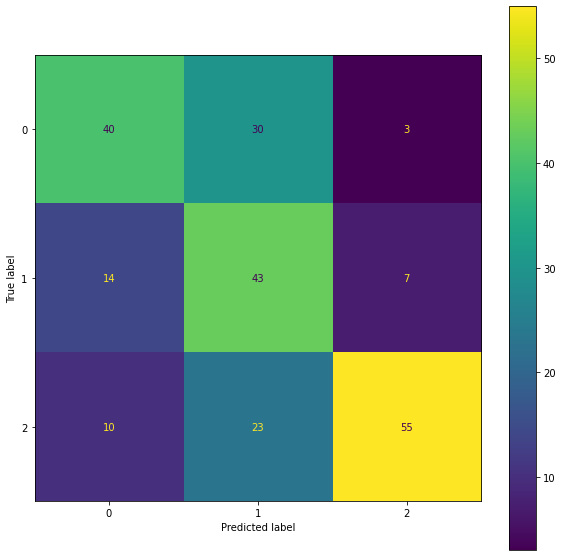

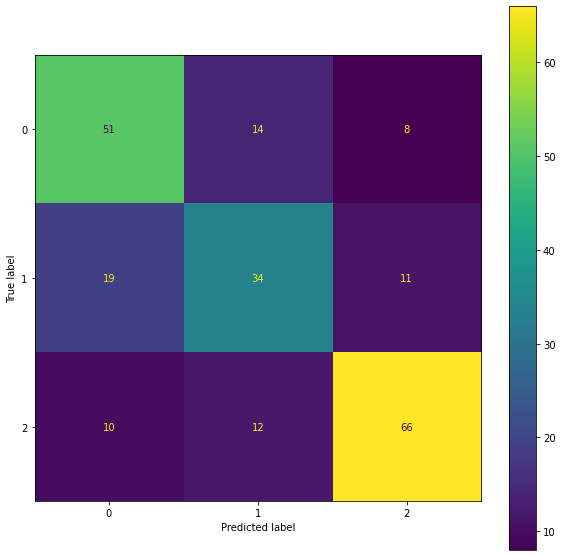

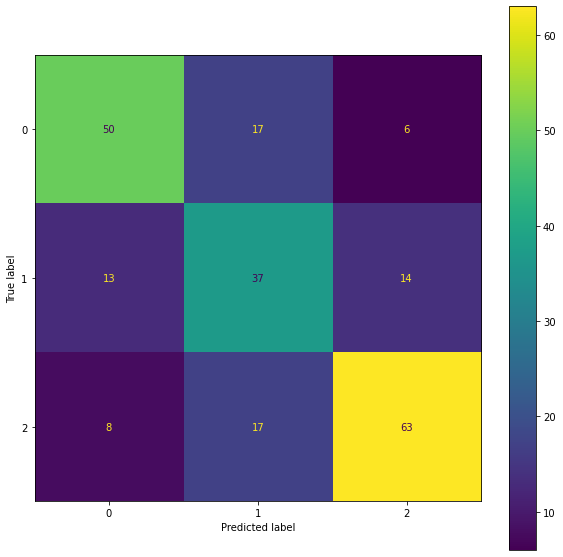

In [51]:
#XGB WITH BEST PARAMETER
best_param = {
    'tfidf' : 0,
    'w2v_ts' : 0,
    'w2v_ds' : 0
}

#TF-IDF
xgb_model = xgb.XGBClassifier(max_depth=7,gamma=0.7,learning_rate=0.1,n_estimators=150,random_state=42)
xgb_model.fit(X_train, y_train)

# KLASIFIKASI DATA TEST
y_pred = xgb_model.predict(X_test)
# CONFUSION MAATRIX
best_param['tfidf'] = metrics.accuracy_score(y_test, y_pred)

# TAMPILKAN CONFUSION MATRIX
fig, ax = plt.subplots(figsize=(10,10))
disp = metrics.ConfusionMatrixDisplay(metrics.confusion_matrix(y_test, y_pred),display_labels=xgb_model.classes_)
disp.plot(ax=ax, values_format='')

# SIMPAN CONFUSION MATRIX
plt.savefig('Dataset/result/tfidf_confu_best_param.png')



#W2V TANPA STOPWORDING
xgb_model_ts = xgb.XGBClassifier(max_depth=6,gamma=0,learning_rate=0.1,n_estimators=100,random_state=42)
xgb_model_ts.fit(eks_fitur_train_ts, y_train_ts)

# KLASIFIKASI DATA TEST
y_pred_ts = xgb_model_ts.predict(eks_fitur_test_ts)
# CONFUSION MAATRIX
best_param['w2v_ts'] = metrics.accuracy_score(y_test_ts, y_pred_ts)

# TAMPILKAN CONFUSION MATRIX
fig, ax = plt.subplots(figsize=(10,10))
disp = metrics.ConfusionMatrixDisplay(metrics.confusion_matrix(y_test_ts, y_pred_ts),display_labels=xgb_model_ts.classes_)
disp.plot(ax=ax, values_format='')

# SIMPAN CONFUSION MATRIX
plt.savefig('Dataset/result/w2v_ts_confu_best_param.png')



#W2V DENGAN STOPWORDING
xgb_model_ds = xgb.XGBClassifier(max_depth=3,gamma=0.5,learning_rate=0.1,n_estimators=100,random_state=42)
xgb_model_ds.fit(eks_fitur_train_ds, y_train_ds)

# KLASIFIKASI DATA TEST
y_pred_ds = xgb_model_ds.predict(eks_fitur_test_ds)
# CONFUSION MAATRIX
best_param['w2v_ds'] = metrics.accuracy_score(y_test_ds, y_pred_ds)

# TAMPILKAN CONFUSION MATRIX
fig, ax = plt.subplots(figsize=(10,10))
disp = metrics.ConfusionMatrixDisplay(metrics.confusion_matrix(y_test_ds, y_pred_ds),display_labels=xgb_model_ds.classes_)
disp.plot(ax=ax, values_format='')

# SIMPAN CONFUSION MATRIX
plt.savefig('Dataset/result/w2v_ds_confu_best_param.png')

In [52]:
best_param

{'tfidf': 0.6133333333333333,
 'w2v_ts': 0.6711111111111111,
 'w2v_ds': 0.6666666666666666}

Pohon ke-1


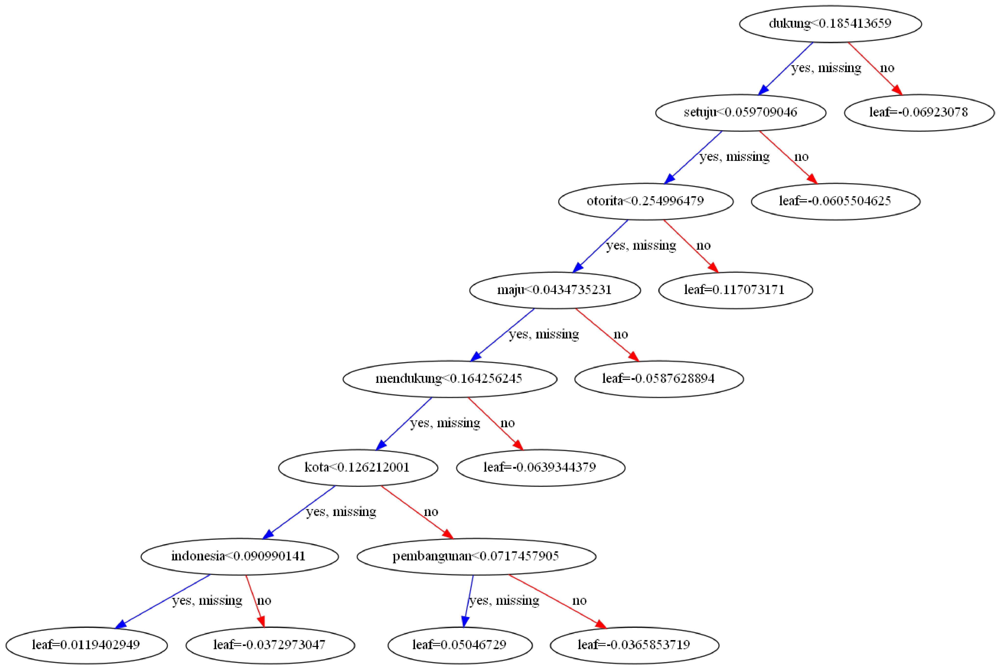

Pohon ke-2


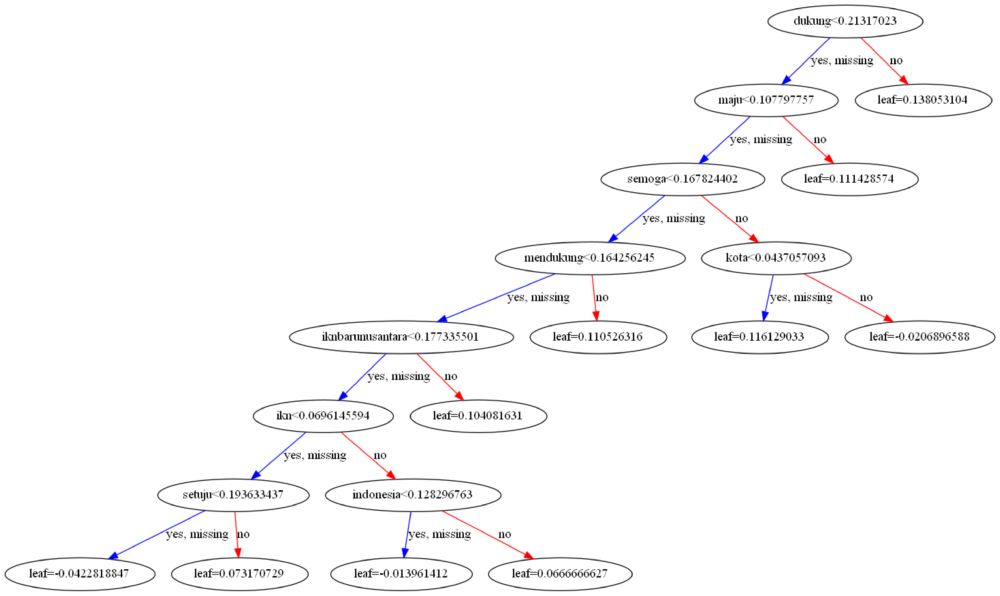

Pohon ke-150


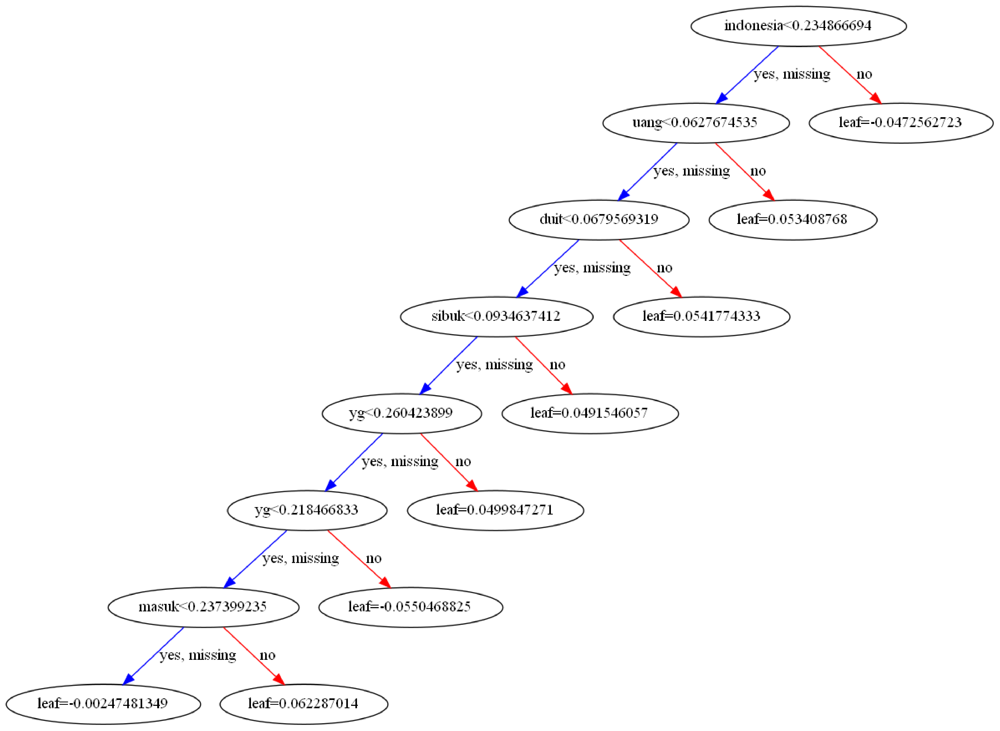

In [53]:
# MENAMPILKAN POHON XGB WITH BEST PARAMETER

# TF-IDF
from xgboost import plot_tree
from matplotlib.pylab import rcParams

rcParams['figure.figsize'] = 80,50

tree = [1,2,150]
for i in tree :
    print("Pohon ke-"+str(i))
    plot_tree(xgb_model, num_trees=i)
    plt.show()

Pohon ke-1


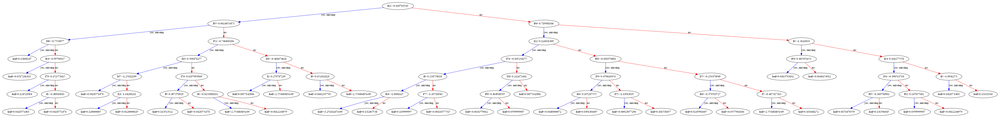

Pohon ke-2


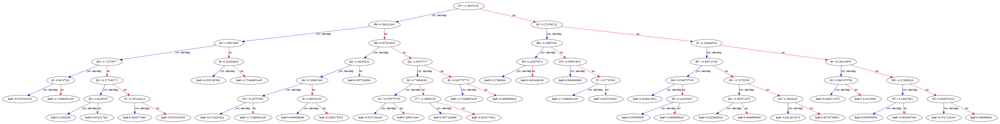

Pohon ke-100


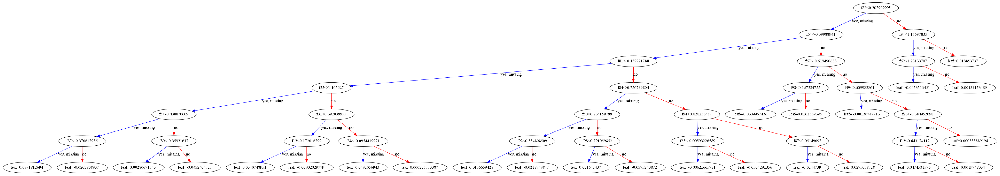

In [54]:
# MENAMPILKAN POHON XGB WITH BEST PARAMETER

# W2V TANPA STOPWORDING
from xgboost import plot_tree
from matplotlib.pylab import rcParams

rcParams['figure.figsize'] = 80,50

tree = [1,2,100]
for i in tree :
    print("Pohon ke-"+str(i))
    plot_tree(xgb_model_ts, num_trees=i)
    plt.show()

Pohon ke-1


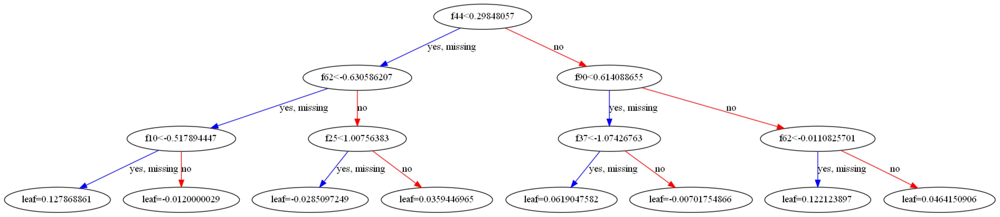

Pohon ke-2


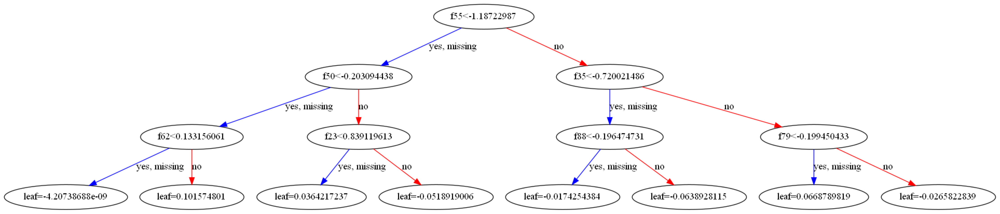

Pohon ke-100


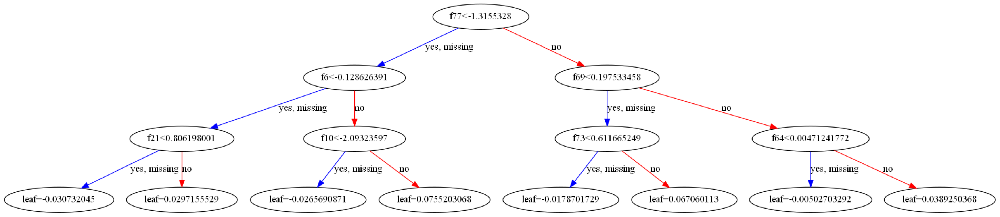

In [55]:
# MENAMPILKAN POHON XGB WITH BEST PARAMETER

# W2V DENGAN STOPWORDING
from xgboost import plot_tree
from matplotlib.pylab import rcParams

rcParams['figure.figsize'] = 80,50

tree = [1,2,100]
for i in tree :
    print("Pohon ke-"+str(i))
    plot_tree(xgb_model_ds, num_trees=i)
    plt.show()